## Combine all combinations


## Top 100

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData"


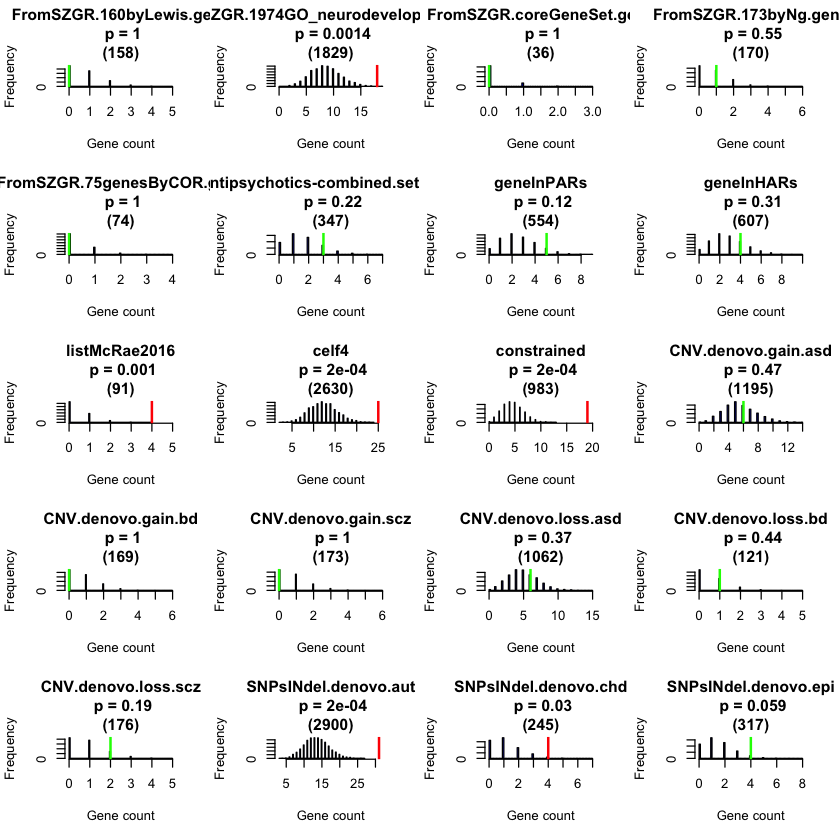

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData"


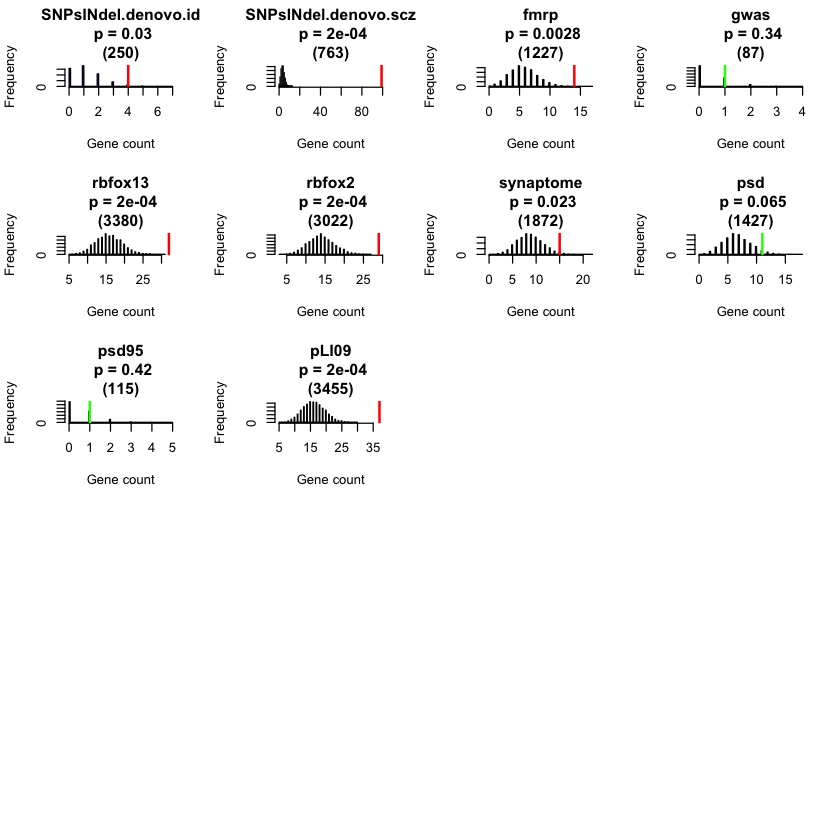

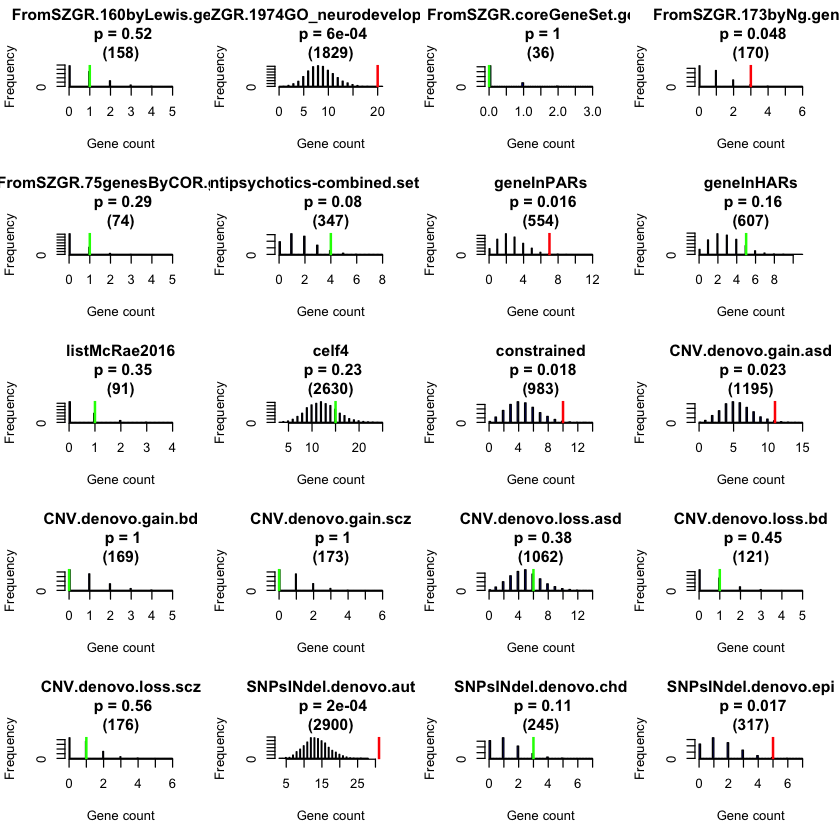

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData"


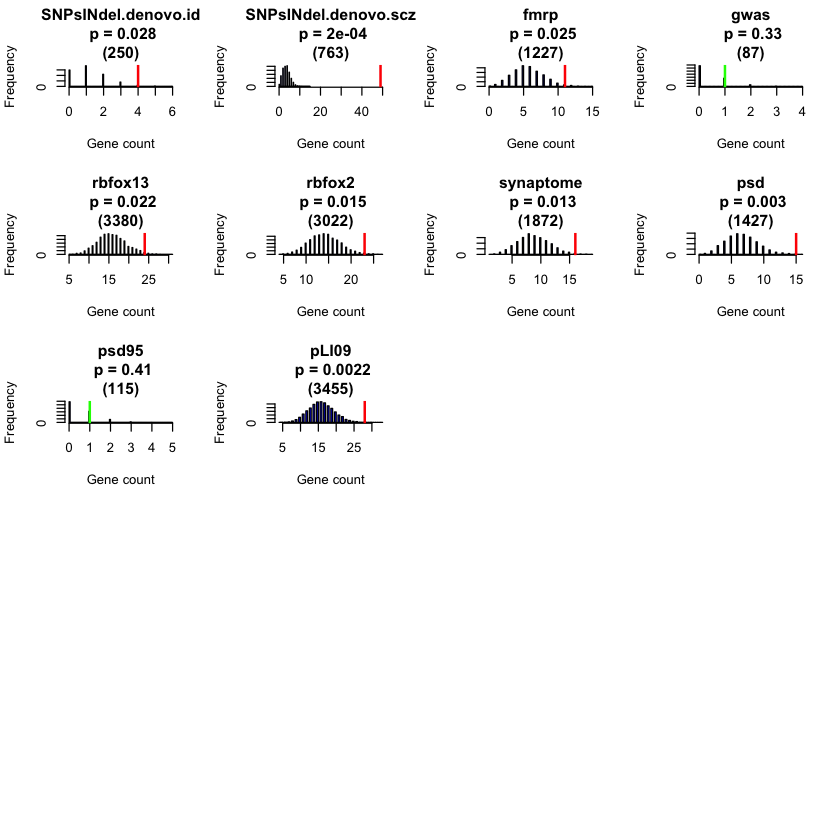

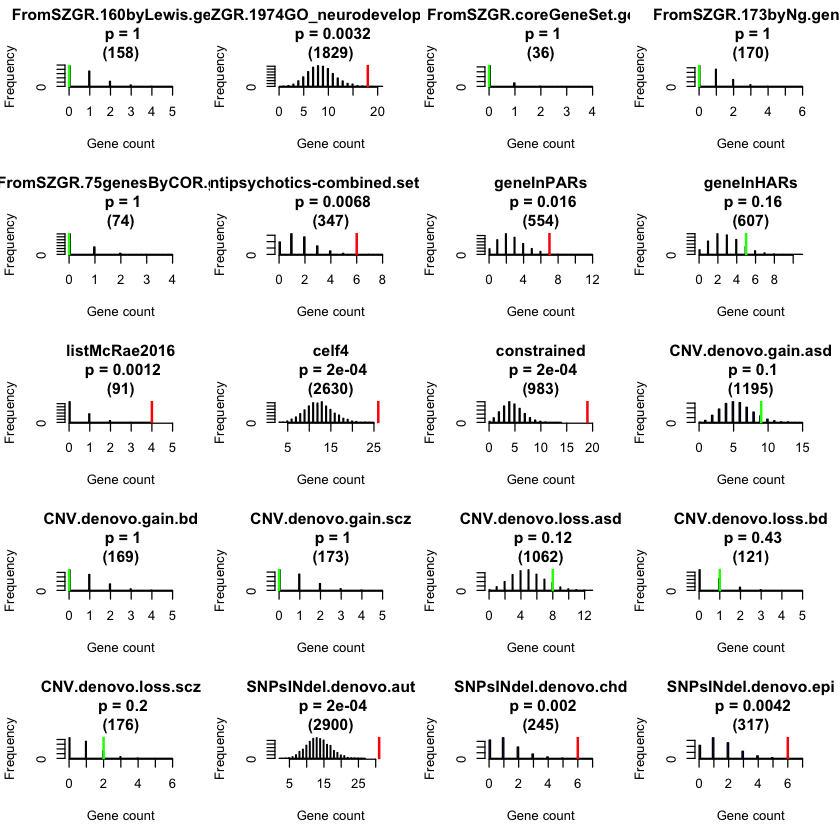

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData"


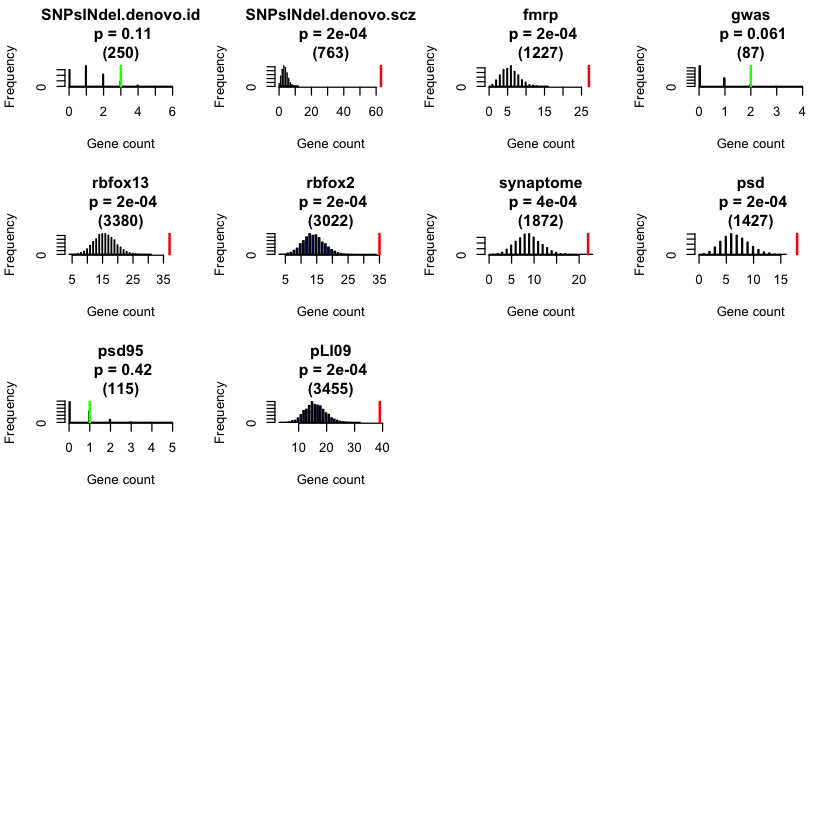

fileN,pList,pList,pList,pList
FromSZGR.160byLewis.gene,1,0.51749650069986,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0013997200559888,0.000599880023995201,0.0031993601279744,0.0001999600079984
FromSZGR.coreGeneSet.gene,1,1,1,1
FromSZGR.173byNg.gene,0.546690661867626,0.0481903619276145,1,0.559488102379524
FromSZGR.75genesByCOR.gene,1,0.285542891421716,1,1
antipsychotics-combined.set.gene,0.217356528694261,0.0797840431913617,0.00679864027194561,0.224155168966207
geneInPARs.txt,0.119776044791042,0.0157968406318736,0.0155968806238752,0.0455908818236353
geneInHARs.txt,0.311137772445511,0.161567686462707,0.156568686262747,0.777844431113777
listMcRae2016.txt,0.000999800039992002,0.352929414117177,0.0011997600479904,0.0121975604879024
celf4.txt,0.0001999600079984,0.233353329334133,0.0001999600079984,0.0171965606878624


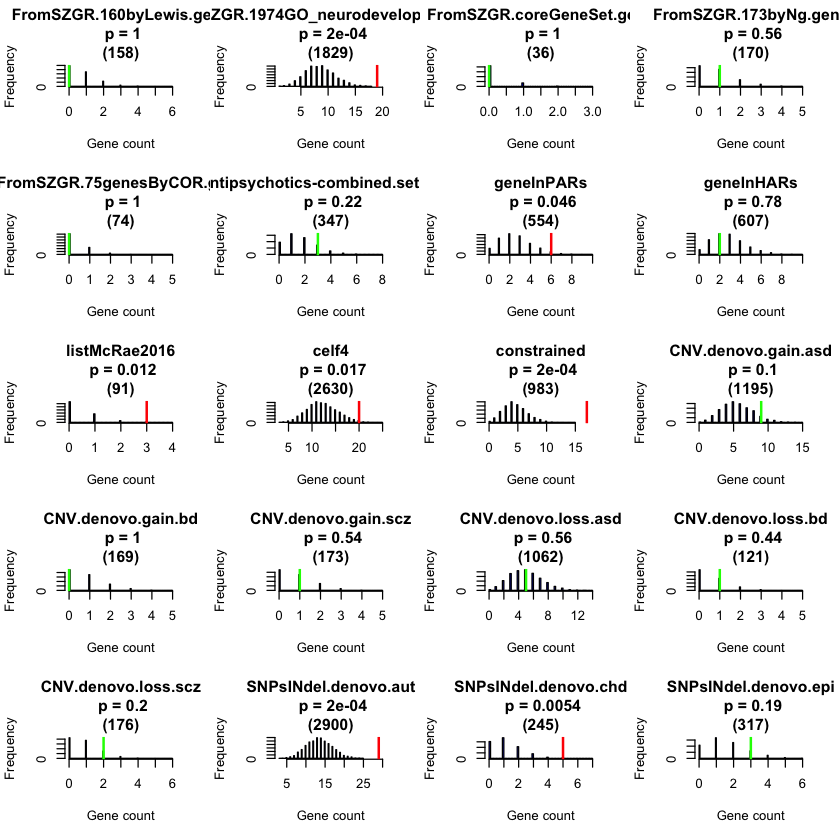

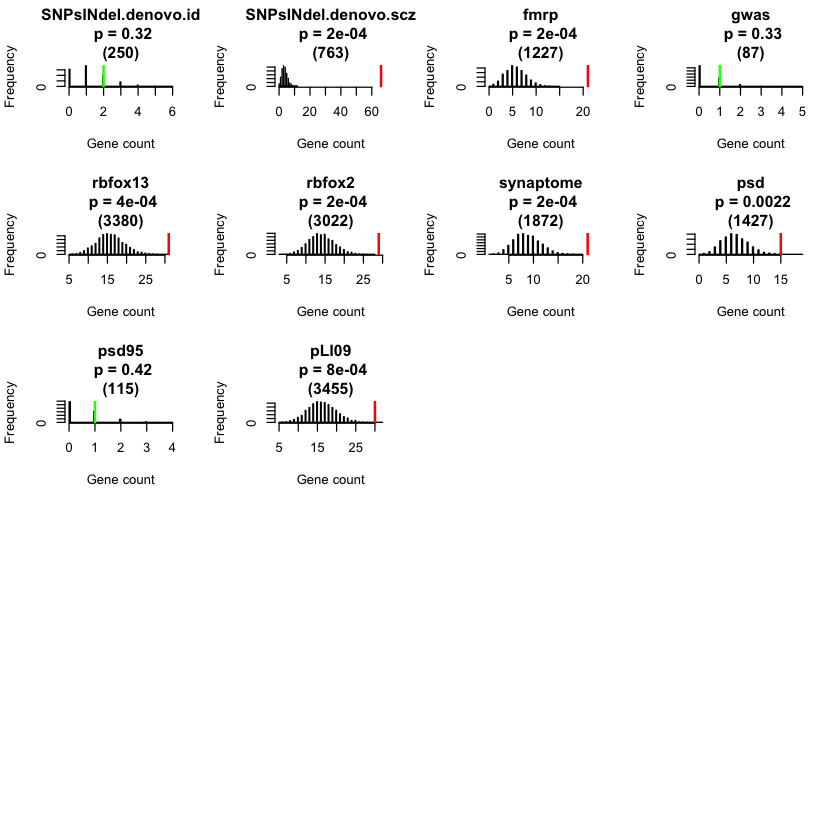

In [1]:
fileAll <- c("test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData",
    "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData",
            "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData",
        "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData")

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

finalTable <- NULL

for (ii in 1:length(fileAll)){

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

#sAll <- sAll[sAll[, 2] < 0.3, ]
sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

    if (pList[kk] < 0.05){
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
  
}

    finalTable <- cbind(finalTable, pList)
#    pOutA <- data.frame(fileN, pList)
#pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
#pOutA
    
    }

cbind(fileN, finalTable)

In [2]:
finalTable1 <- apply(finalTable, 2, function(x) signif(x,  2))
    
 colnames(finalTable1) <- paste0(gsub("lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "\nTop100")
b100 <- cbind(fileN, finalTable1)
b100

fileN,SingletonTransmitted Top100,SingletonTransmitted_noexac Top100,SingletonTransmittedAndCC_noexac Top100,SingletonTransmittedAndCC Top100
FromSZGR.160byLewis.gene,1,0.52,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0014,6e-04,0.0032,2e-04
FromSZGR.coreGeneSet.gene,1,1,1,1
FromSZGR.173byNg.gene,0.55,0.048,1,0.56
FromSZGR.75genesByCOR.gene,1,0.29,1,1
antipsychotics-combined.set.gene,0.22,0.08,0.0068,0.22
geneInPARs.txt,0.12,0.016,0.016,0.046
geneInHARs.txt,0.31,0.16,0.16,0.78
listMcRae2016.txt,0.001,0.35,0.0012,0.012
celf4.txt,2e-04,0.23,2e-04,0.017


## FDR 0.3

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData"


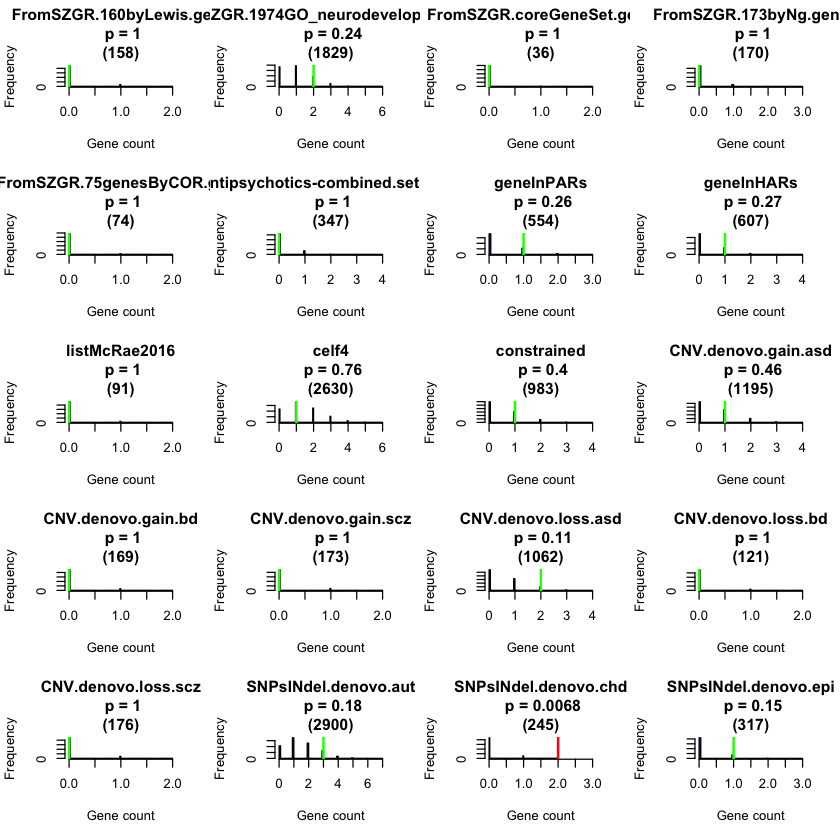

[1] "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData"


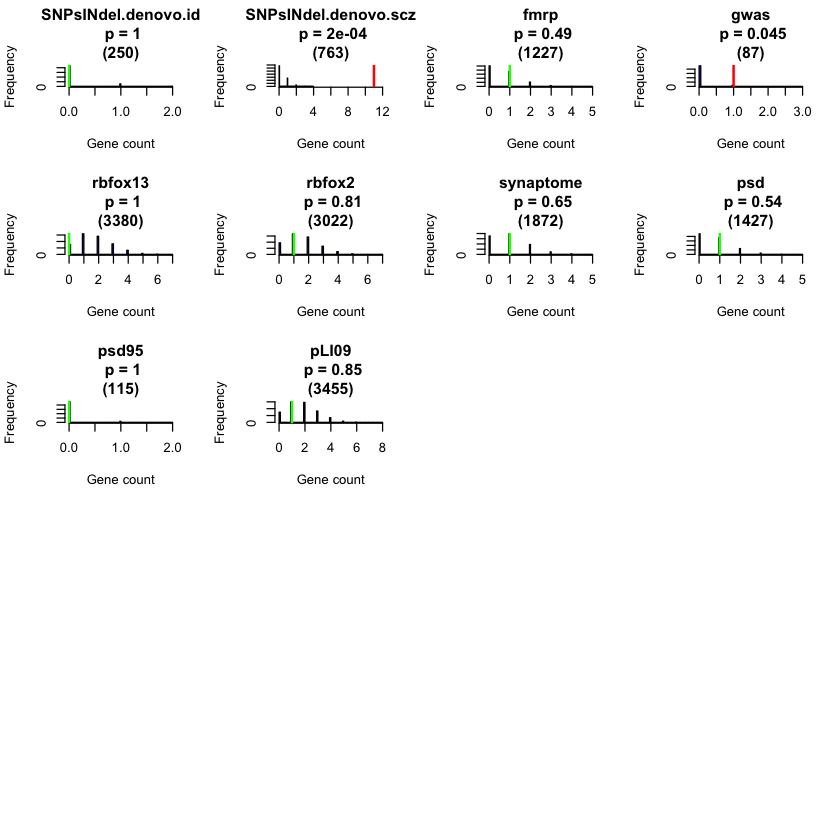

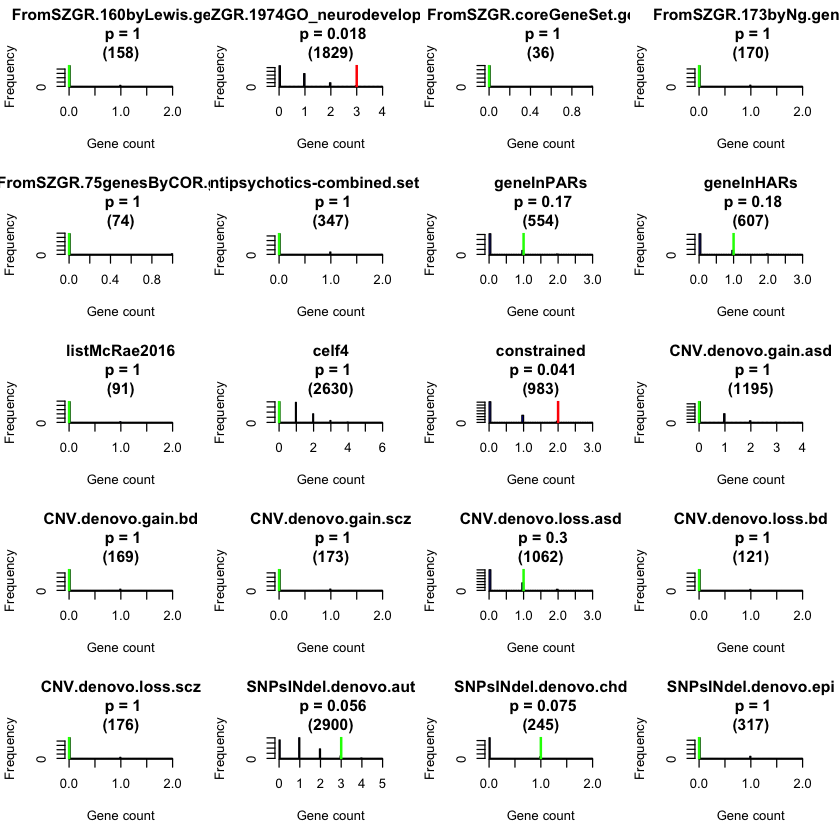

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData"


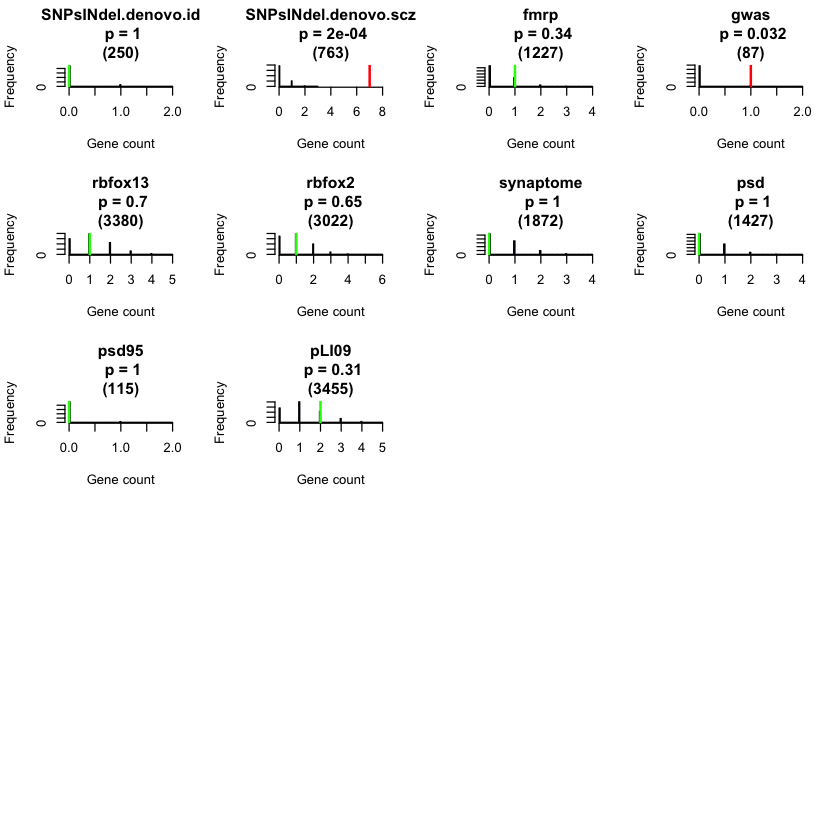

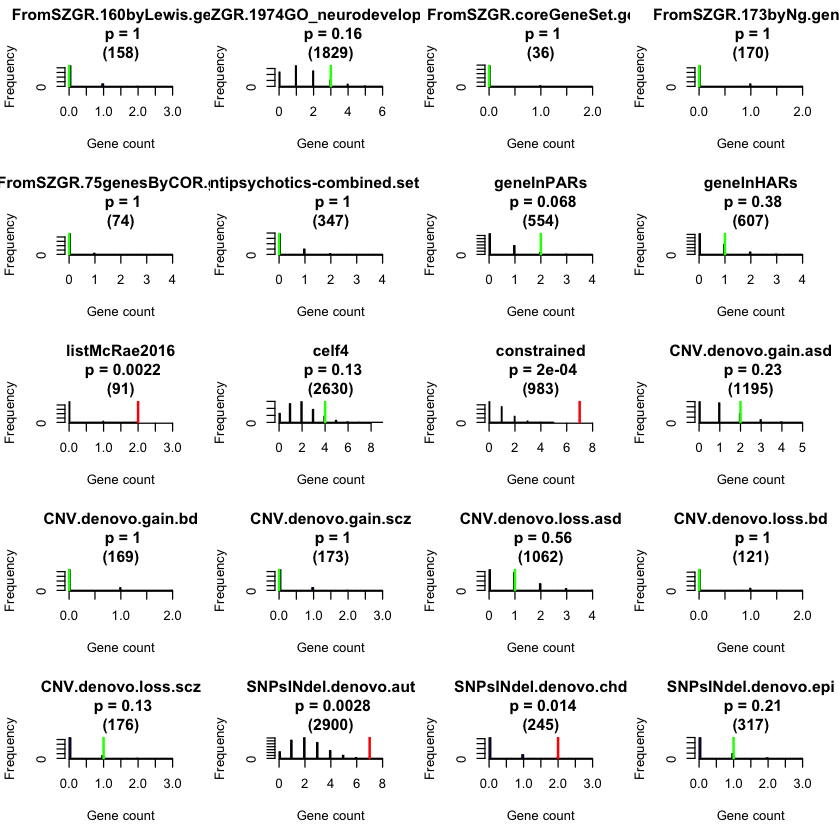

[1] "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData"


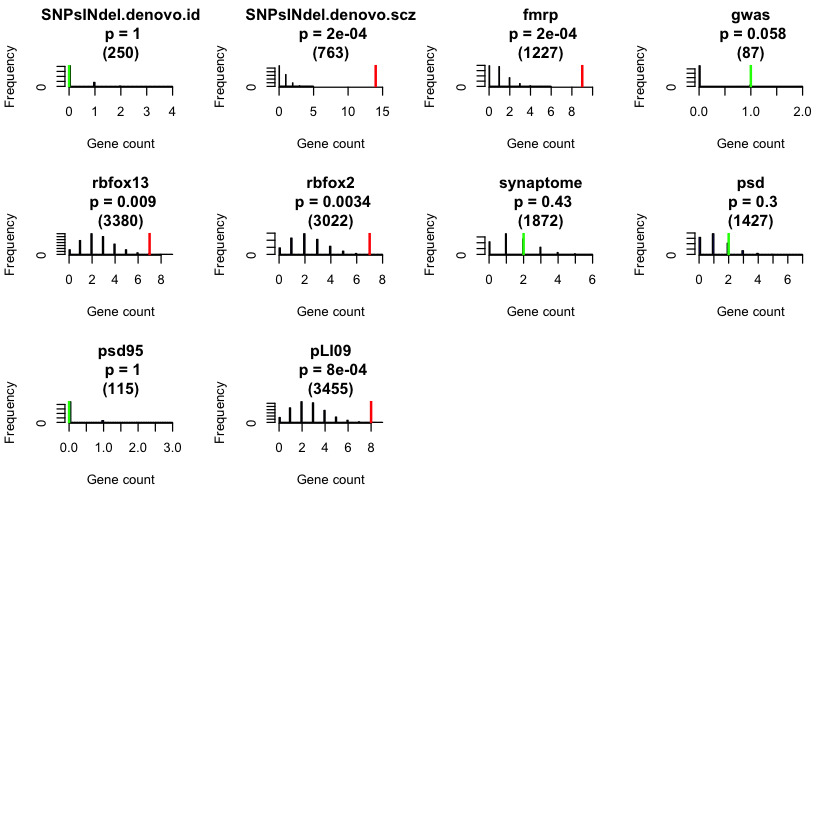

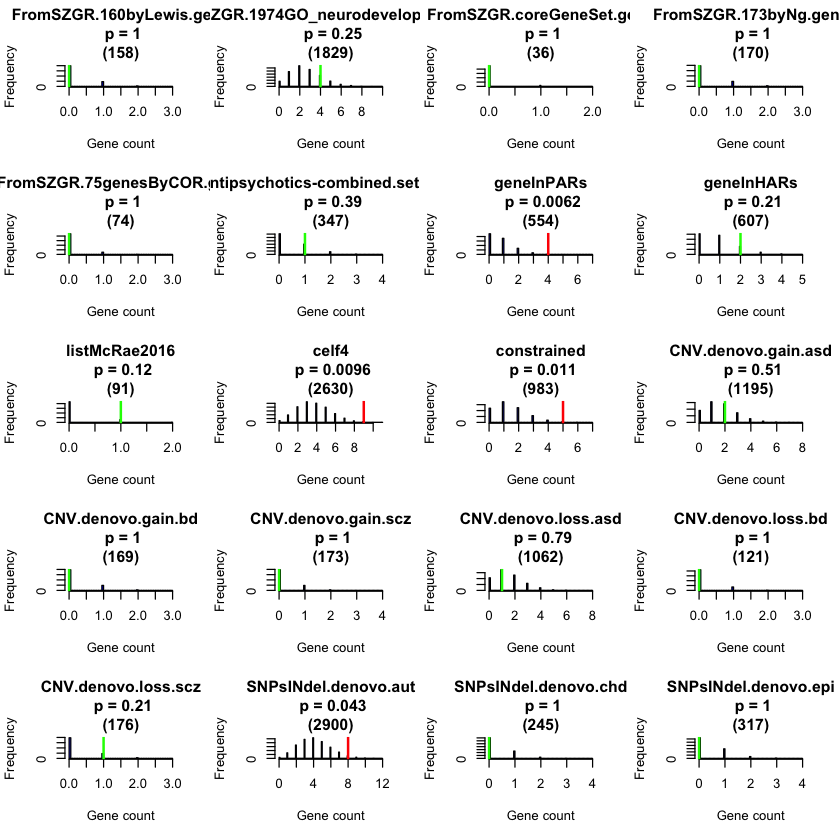

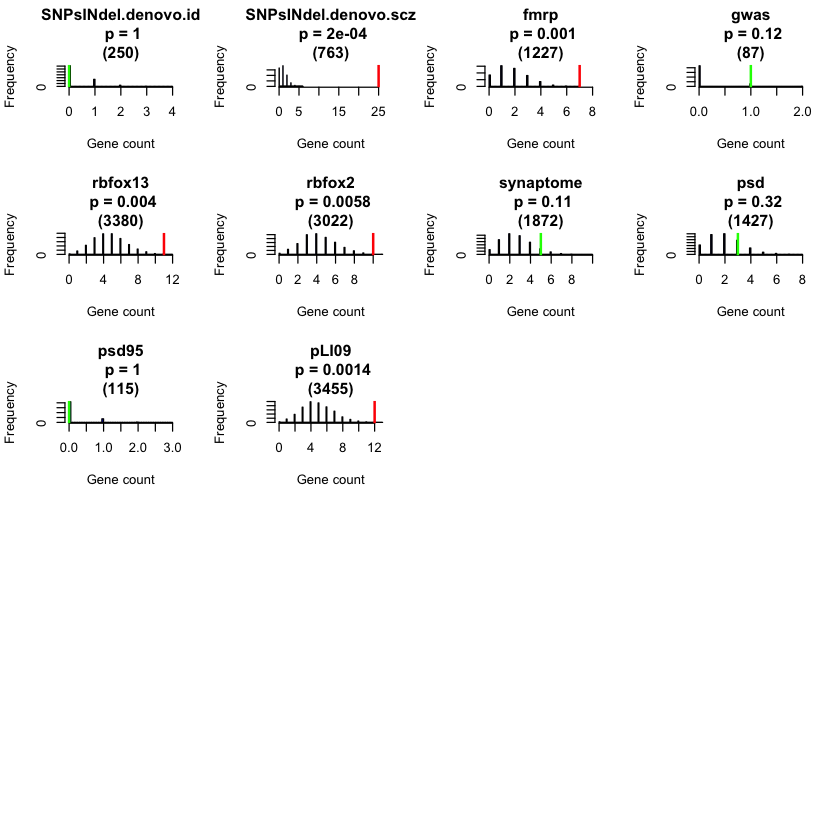

In [3]:
fileAll <- c("test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData.damaging_SingletonTransmittedData.lowerHyperGamma.1.notChangeDN.RData",
    "test_rstan_2016.Pio.1.nIteration10000.nThin.10.index.00_51_May_30_2016.lof_SingletonTransmittedData_noexac.damaging_SingletonTransmittedData_noexac.lowerHyperGamma.1.notChangeDN.RData",
            "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC_noexac.damaging_SingletonTransmittedDataAndCC_noexac.lowerHyperGamma.1.notChangeDN.RData",
        "test_rstan_2016.Pio.1.nIteration20000.nThin.20.index.00_51_May_30_2016.lof_SingletonTransmittedDataAndCC.damaging_SingletonTransmittedDataAndCC.lowerHyperGamma.1.notChangeDN.RData")

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")

finalTableF03 <- NULL

for (ii in 1:length(fileAll)){

xAll <- readLines("../data/list.allGenes.txt")
xFMRP <- readLines("../data/list.FMRP.txt")
print(fileAll[ii])
allGeneList <- read.table(paste0("../data/FDR.oldBayesFactorCC.", fileAll[ii]), header = TRUE)

sAll <- allGeneList[, c("Gene", "qvalue")]

sAll <- sAll[sAll[, 2] < 0.3, ]
#sAll <- head(sAll, 100)
xResult <- as.character(sAll[, 1])

fileN <- c("FromSZGR.160byLewis.gene",
           "FromSZGR.1974GO_neurodevelopment.gene", "FromSZGR.coreGeneSet.gene",
           "FromSZGR.173byNg.gene", "FromSZGR.75genesByCOR.gene",
    "antipsychotics-combined.set.gene",
    "geneInPARs.txt",
           "geneInHARs.txt",
           "listMcRae2016.txt",
           "celf4.txt", 
"constrained.txt", 
           "CNV.denovo.gain.asd.txt",
"CNV.denovo.gain.bd.txt",
"CNV.denovo.gain.scz.txt",
"CNV.denovo.loss.asd.txt",
"CNV.denovo.loss.bd.txt",
"CNV.denovo.loss.scz.txt",
           "SNPsINdel.denovo.aut.txt",
"SNPsINdel.denovo.chd.txt",
"SNPsINdel.denovo.epi.txt",
"SNPsINdel.denovo.id.txt",
"SNPsINdel.denovo.scz.txt",
           
"fmrp.txt", 
"gwas.txt", 
"rbfox13.txt", 
"rbfox2.txt", 
           "synaptome.txt",
          "psd.txt", "psd95.txt", "pLI09.txt")

pList <- NULL
nG <- NULL
lGeneSet <- NULL

pAllFDR <- NULL



par(mfrow = c(5, 4))
for (kk in 1:length(fileN)){
x1 <- read.table(paste("../data/genelists/genesListFromGuilio/", fileN[kk], sep = ""))
xFMRP <- as.character(x1[, 1])
xFMRP <- unique(xFMRP)
xFMRP <- intersect(xFMRP, xAll) ###Make sure they use the same symbols
l1 <- length(xFMRP)
lGeneSet[kk] <- l1
    
nSample <- 5000 ##Number of sampling from all genes
outList <- NULL

xIntersect <- length(intersect(xFMRP, xResult))
nG[kk] <- xIntersect
for (i in 1:nSample){
  tempGene <- sample(xAll, l1)
  outList[i] <- length(intersect(tempGene, xResult))
  
}

#plot(density(outList))
#abline(v = xIntersect)
pList[kk] <- (1 +  length(outList[outList >= xIntersect])) /(1 + nSample)

    if (pList[kk] < 0.05){
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'red', lwd = 2)
    
} else {
          hist(outList, 100, main = paste(gsub(".txt", "", fileN[kk]),
                                    "\n p = ", signif(pList[kk], 2),
                                    "\n", "(", length(xFMRP), ")",
                                    sep = ""), 
         xlim = range(c(outList, xIntersect + 1)), xlab = "Gene count", col = 'blue')
    abline(v = xIntersect, col = 'green', lwd = 2)
    }
    #########TEST all FDRs
  
}

    finalTableF03 <- cbind(finalTableF03, pList)
#    pOutA <- data.frame(fileN, pList)
#pOutA <- pOutA[order(as.numeric(pOutA[, 2])), ]
#pOutA
    
    }



In [4]:
nTest <- dim(finalTable)[1]
nTest <- 1
finalTable1 <- apply(finalTable, 2, function(x) signif(x*nTest,  2))
b100 <- cbind(fileN, finalTable1)
#b100
    colnames(finalTable1) <- paste0("\\rotatebox{90}{",gsub("mitted|And|Singleton|_|lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "Top100}")
finalTable2 <- apply(finalTableF03, 2, function(x) signif(x*nTest,  2))
    
    colnames(finalTable2) <- paste0("\\rotatebox{90}{", gsub("mitted|mittedAnd|And|Singleton|_|lof_|Data", "", lapply(fileAll, 
                                    function(xy) unlist(strsplit(xy, ".", fixed = TRUE))[9])),
                                        "(FDR0.3)}")
bF03 <- cbind(fileN, finalTable2)
#bF03
      
bAll <- cbind(fileN, finalTable1, finalTable2)
colnames(bAll)[1] <- "Gene set"
 bAll               
write.table(bAll, paste0("../data/resultsGeneSet2ClassesFromBayesFactor.txt"), sep = " & ", row.names = FALSE, quote = FALSE)

Gene set,\rotatebox{90}{TransTop100},\rotatebox{90}{TransnoexacTop100},\rotatebox{90}{TransCCnoexacTop100},\rotatebox{90}{TransCCTop100},\rotatebox{90}{Trans(FDR0.3)},\rotatebox{90}{Transnoexac(FDR0.3)},\rotatebox{90}{TransCCnoexac(FDR0.3)},\rotatebox{90}{TransCC(FDR0.3)}
FromSZGR.160byLewis.gene,1,0.52,1,1,1,1,1,1
FromSZGR.1974GO_neurodevelopment.gene,0.0014,6e-04,0.0032,2e-04,0.24,0.018,0.16,0.25
FromSZGR.coreGeneSet.gene,1,1,1,1,1,1,1,1
FromSZGR.173byNg.gene,0.55,0.048,1,0.56,1,1,1,1
FromSZGR.75genesByCOR.gene,1,0.29,1,1,1,1,1,1
antipsychotics-combined.set.gene,0.22,0.08,0.0068,0.22,1,1,1,0.39
geneInPARs.txt,0.12,0.016,0.016,0.046,0.26,0.17,0.068,0.0062
geneInHARs.txt,0.31,0.16,0.16,0.78,0.27,0.18,0.38,0.21
listMcRae2016.txt,0.001,0.35,0.0012,0.012,1,1,0.0022,0.12
celf4.txt,2e-04,0.23,2e-04,0.017,0.76,1,0.13,0.0096


In [5]:
 bAll[bAll[, dim(bAll)[2]] < 0.05, ][, c(1, dim(bAll)[2])]

Gene set,\rotatebox{90}{TransCC(FDR0.3)}
geneInPARs.txt,0.0062
celf4.txt,0.0096
constrained.txt,0.011
SNPsINdel.denovo.aut.txt,0.043
fmrp.txt,0.001
rbfox13.txt,0.004
rbfox2.txt,0.0058
pLI09.txt,0.0014


## Correct p use "BH" method

In [6]:
b2 <- bAll[, dim(bAll)[2]]
names(b2) <- bAll[, 1]
b3 <- p.adjust(b2, method = "BH")
b23 <- cbind(b2, b3)

b23[order(b23[, 2]),]
#pLI09: haplo-insufficient gene list

,b2,b3
SNPsINdel.denovo.scz.txt,2e-04,0.006
fmrp.txt,0.001,0.014
pLI09.txt,0.0014,0.014
rbfox13.txt,0.004,0.03
geneInPARs.txt,0.0062,0.031
rbfox2.txt,0.0058,0.031
celf4.txt,0.0096,0.0411428571428571
constrained.txt,0.011,0.04125
SNPsINdel.denovo.aut.txt,0.043,0.143333333333333
listMcRae2016.txt,0.12,0.3
